### Introduction to Nonlinear Dynamics HW1: Pratik Aghor
### Dynamics of the logistic map

In [1]:
using LinearAlgebra
using Plots
using Roots
using Polynomials

In [2]:
f(r, x) = r*x*(1-x)

f (generic function with 1 method)

In [3]:
# iterate f n times, given an initial condition x0
function fIter(f, r, x0, nIter)
    xt = zeros(nIter+1)
    for i = 1:nIter+1
        xt[i] = x0
        # print(f(r, x0), '\n')
        # update for iteration
        x0 = f(r, x0)
    end
    return xt
end

fIter (generic function with 1 method)

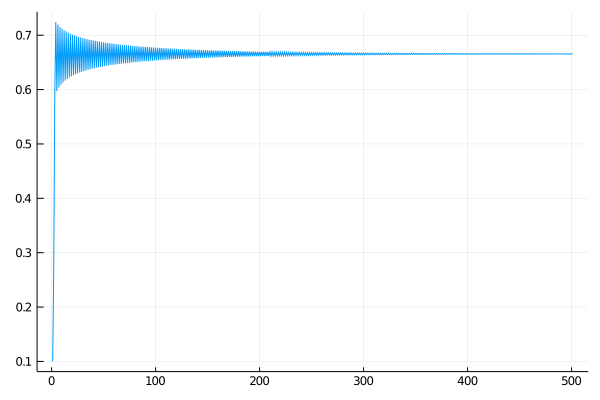

In [4]:
xt = fIter(f, 2.99, 0.1, 500)
plot(xt, label="")

## Q1. Orbit diagram of the logistic map

In [5]:
function plot_orbit_diagram(r_vec)
    nItermax = 1000 # max nIter
    n0 = 40 # plot only last n0 points, to filter transients
    nr = size(r_vec)[1]
    # passed r_vec as an input arg to avoid defining it again and again in the main
    # r_vec = LinRange(0, 4, nr) # define parameter values of r
    scatter([minimum(r_vec)], color=:black, label="", markersize=0.1) # initialize
    one_array = ones(nItermax)
    for i=1:nr
        r = r_vec[i]
        xt = fIter(f, r, 0.1, nItermax)
        scatter!(r*one_array[nItermax-n0:nItermax], xt[nItermax-n0:nItermax], markershape=:circle, markercolor=:black, markerstrokewidth=0, markersize=0.1, label="")
    end
    plot!(xlabel="r",ylabel="x", xlims=(0,4), title="Orbit diagram of the logistic map")

end

plot_orbit_diagram (generic function with 1 method)

In [6]:
Nr = 1000
r_vec = LinRange(0, 4, Nr);
plot_orbit_diagram(r_vec)

In [7]:
# find the index of an element closest to a given value (val) in an array (x)
function findnearest(x, val)
    ibest = 1
    dxbest = abs(x[ibest]-val)
    for i in eachindex(x)
        dx = abs(x[i]-val)
        if dx < dxbest
            dxbest = dx
            ibest = i
        end
    end
    
    return ibest
end 

findnearest (generic function with 1 method)

In [8]:
function plot_orbit_envelopes(r_vec)
    plot_orbit_diagram(r_vec)
    
    nr = size(r_vec)[1]
    x0 = zeros(nr)
    idx1 = findnearest(r_vec, 1)
    idx2 = findnearest(r_vec, 3)
    idx3 = findnearest(r_vec, 1+sqrt(6))
    x1 = ones(nr) - 1 ./r_vec
    
    r_2_orbit = r_vec[idx2+1:end]
    nr2 = size(r_2_orbit)[1]
    xp = ( r_2_orbit + ones(nr2) .+ sqrt.((r_2_orbit-3*ones(nr2)) .* (r_2_orbit+ones(nr2)) ) ) ./(2 .*r_2_orbit)
    xq = ( r_2_orbit + ones(nr2) .- sqrt.((r_2_orbit-3*ones(nr2)) .* (r_2_orbit+ones(nr2)) ) ) ./(2 .*r_2_orbit)
    
    plot!(r_vec[1:idx1], x0[1:idx1], color="red", linewidth=2.0, linestyle=:solid, label="x0*")
    plot!(r_vec[idx1:end], x0[idx1:end], color="red", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(r_vec[idx1:idx2], x1[idx1:idx2], color="blue", linewidth=2.0, linestyle=:solid, label="x1*")
    plot!(r_vec[idx2:end], x1[idx2:end], color="blue", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(r_2_orbit[1:idx3-idx2], xp[1:idx3-idx2], color="green", linewidth=2.0, linestyle=:solid, label="2-orbit xp, xq")
    plot!(r_2_orbit[idx3-idx2:end], xp[idx3-idx2:end], color="green", linewidth=2.0, linestyle=:dash, label="")
    plot!(r_2_orbit[1:idx3-idx2], xq[1:idx3-idx2], color="green", linewidth=2.0, linestyle=:solid, label="")
    plot!(r_2_orbit[idx3-idx2:end], xq[idx3-idx2:end], color="green", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(legend=:topleft)
end

plot_orbit_envelopes (generic function with 1 method)

In [9]:
plot_orbit_envelopes(r_vec)

## Q2: Bifurcation and Stability of the $4$-orbit
* For finding the root directly, we find the intersections of the $4^{th}$ iterate of the logistic map with identity. 

In [10]:
f4(r, x) = f(r, f(r, f(r, f(r, x)))) # 4th iterate of f(r, x)

f4 (generic function with 1 method)

In [11]:
function plotf(g, r)
    # define x between 0 and 1
    nx = 1000
    mid= Int64(nx/2)
    x = range(0.0, stop=1.01, length=nx)
    y = zeros(nx)
    y = g.(r, x)
    plot(x, y, color=:blue, linewidth =:2)
    plot!(x, x, color=:red, linestyle =:dash, linewidth=:2)
    plot!(legend=false, xlabel="x",ylabel="f4(x)", xlims=(-0.001,1.1), ylims=(-0.001,1.1))
end

plotf (generic function with 1 method)

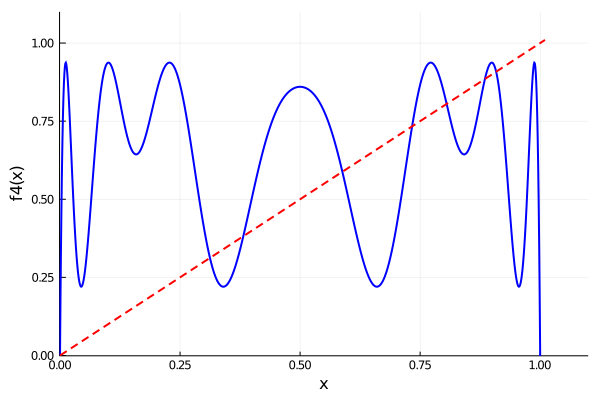

In [12]:
plotf(f4, 1+sqrt(6)+0.3)

In [13]:
# using NLsolve 

# g(x) = F(x) - x, where F(x) is nth iterate of the logistic map. 
# Thus roots of g(x) == 0 are periodic orbits
# NOTE: nsolve takes everything in terms of arrays, so treat x as a 1 x 1 array object, convert to float later
# function g!(gx, x, r)
#     gx[1] = f4(r, x[1]) - x[1]
# end
# xguess = 0.8
# eps = 1e-4
# r = 1+sqrt(6)+eps # value above 1+sqrt(6)
# x1 = nlsolve((gx,x) -> g!(gx,x,r), [xguess]) # cast g! ONLY in terms of gx and x
# x1.zero
# a = norm(x1.zero) # trick to convert 1 x 1 array type into float

In [14]:
eps = 1e-5
r = 1+sqrt(6)+eps # value above 1+sqrt(6)
xguess = 0.84

x = variable() # needs using Polynomials
root = find_zero(f4(r, x) - x, xguess)

0.8490157004411916

In [15]:
# at a given r, iterate n+1 times and make sure we are actually on an n-orbit, used later
function verify_orbit(r, x0, n, tol=1e-6)
    trajectory = fIter(f, r, x0 , n+1 ) # check period-4 orbit
    if(abs(trajectory[n+1] - trajectory[1]) < tol)
        return true
    else return false
    end
end

verify_orbit (generic function with 2 methods)

In [16]:
verify_orbit(r, root, 4, 1e-5)

true

In [17]:
orb4 = fIter(f, r, root, 3) # define the points on the 4-orbit

4-element Array{Float64,1}:
 0.8490157004411916 
 0.442184613924585  
 0.8508445727736857 
 0.43776940916984014

In [18]:
# an inefficient, naive way to make cobwebplots
function cobwebplot_naive(f, r, x0, nIter)
    x = zeros(2*nIter+1)
    y = zeros(2*nIter+1)
    x[1] = x0
    y[1] = f(r, x0)
    for i=2:2*nIter+1
        x[i] = y[i-1]
        y[i] = f(r, x[i-1])
    end
    plotf(f, r)
    plot!(x, y, color=:black, linewidth =:2)
end

cobwebplot_naive (generic function with 1 method)

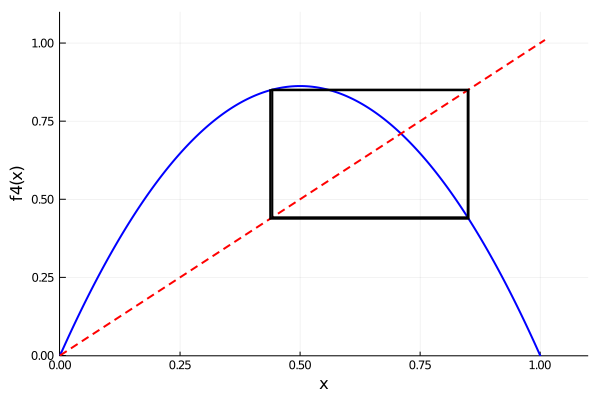

In [19]:
cobwebplot_naive(f, r, orb4[1], 10)

In [20]:
fPrime(r, x) = r*(1-2*x) # define f'(x) = r(1-2x)

fPrime (generic function with 1 method)

### given an r and an x-orbit, obtain the Floquet multiplier 
$$\Lambda_{p}= \prod_{i=1}^{n} f'(x_{i})$$

In [21]:
function get_floquet_multiplier(fPrime, r, xorb)
    n = size(xorb)[1]
    Lambda_p = 1.
    for i = 1:n
        Lambda_p *= fPrime(r, xorb[i])
    end
    return Lambda_p
end

get_floquet_multiplier (generic function with 1 method)

In [22]:
multiplier = get_floquet_multiplier(fPrime, r, orb4)
@show multiplier
fPrime(r, orb4[4])*fPrime(r, orb4[3])*fPrime(r, orb4[2])*fPrime(r, orb4[1])

multiplier = 0.9980482363123726


0.9980482363123726

did not converge for r =3.478902337037407	 adjusting guess...


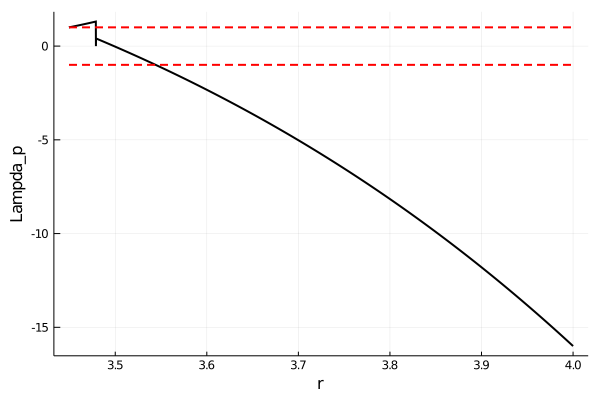

In [23]:
Nr = 5000
eps = 1e-5
r_vec = LinRange(1+sqrt(6) + eps, 4, Nr);
xguess = 0.8

Lambda_p_array = zeros(Nr)

for i = 1:Nr
    # find the 4-orbit, verify the 4-orbit, and get the Floquet multiplier as a function of r
    x = variable() # needs using Polynomials
    r = r_vec[i]
    x0 = find_zero(f4(r, x) - x, xguess)
    if(verify_orbit(r, x0, 4, 1e-6) == true)
        orb4 = fIter(f, r, x0, 3)
        Lambda_p_array[i] = get_floquet_multiplier(fPrime, r, orb4)
        xguess = orb4[1] # update xguess
    else
        print("did not converge for r =", r, "\t adjusting guess...\n")
        # get the next iterate on the orbit, since we're only interested in the orbit as a whole set
        xguess = fIter(f, r, xguess, 1) 
    end
end

plot(r_vec, Lambda_p_array, color=:black, linewidth =:2, label="")
plot!(r_vec, ones(Nr), color=:red, linestyle=:dash, linewidth =:2, label="")
plot!(r_vec, -ones(Nr), color=:red, linestyle=:dash, linewidth =:2, label="")

plot!(xlabel = "r", ylabel = "Lampda_p")

In [24]:
a = abs. (Lambda_p_array .+ ones(Nr)) # added 1, because want crossing with Lambda_p=-1, from above Fig.
idx = argmin(a)

r_critical = r_vec[idx]

3.544094605945661

# Q 3: Finding $\delta = (r_{n} - r_{n-1})/(r_{n+1}-r_{n})$ 

In [25]:
r1 = 1
r2 = 3
r3 = 1+sqrt(6)
r4 = r_critical

delta1 = (r2 - r1)/(r3 - r2)
delta2 = (r3 - r2)/(r4 - r3)

@show delta1
@show delta2

delta1 = 4.4494897427831805
delta2 = 4.751232946779728


4.751232946779728

# Q4 Bifucrcation and Stability of the $8$-orbit

In [26]:
f8(r, x) = f4(r, f4(r, x)) # 8th iterate of f(r, x)

f8 (generic function with 1 method)

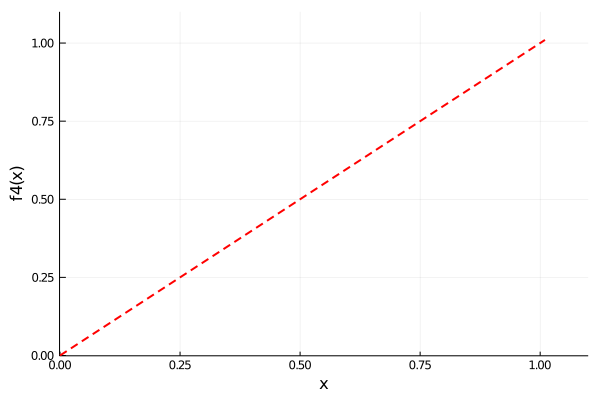

In [27]:
dr = 1e-3
r = r4 + dr # value above r4
plotf(f8, r)

In [28]:
eps = 1e-5
x = variable() # needs using Polynomials
xguess = 0.28
root = xguess
counter = 0
maxcounter = 2000

while(abs(root - f8(r, root)) > eps && counter < maxcounter)
    xguess = root
    root = find_zero(f8(r, x) - x, xguess)
    err = abs(root - f8(r, root))
     if(mod(counter, 100)==0)
        @show xguess, err
    end
    counter +=1
end
@show root, err

(xguess, err) = (0.28, 0.4989227291368868)
(xguess, err) = (0.27972921350067054, 0.514110592968193)
(xguess, err) = (0.2798015055315454, 0.506597211146796)
(xguess, err) = (0.27627217978388124, 0.5823609634834253)
(xguess, err) = (0.2772233375520355, 0.5666913291934556)
(xguess, err) = (0.27745922437531767, 0.562150097718336)
(xguess, err) = (0.2758754885481512, 0.5885527398961157)
(xguess, err) = (0.27576988368668476, 0.589948510029939)
(xguess, err) = (0.2736830280898275, 0.6094443917927641)
(xguess, err) = (0.2738680434845664, 0.6083551227459518)
(xguess, err) = (0.273856175919365, 0.6085086373985175)
(xguess, err) = (0.2775446387361751, 0.5604463890396885)
(xguess, err) = (0.24059149240590716, 0.6452574913532929)
(xguess, err) = (0.24012853464065703, 0.6459519432856939)
(xguess, err) = (0.24010550603159558, 0.6459850135232572)
(xguess, err) = (0.24010550603159558, 0.6459850135232572)
(xguess, err) = (0.24010550603159558, 0.6459850135232572)
(xguess, err) = (0.24010550603159558, 0.6

UndefVarError: UndefVarError: err not defined

In [29]:
verify_orbit(r, root, 2, 1e-6)

false

In [30]:
verify_orbit(r, root, 4, 1e-5)

false

In [31]:
verify_orbit(r, root, 8, 1e-4)

false

In [32]:
fIter(f, r, root, 10)

11-element Array{Float64,1}:
 0.24010550603159558
 0.6468197116712097 
 0.8098554938366819 
 0.545907604398726  
 0.8788023357415364 
 0.3775837384631416 
 0.8331477815869066 
 0.4928126611003807 
 0.8860905195548529 
 0.35782097143346026
 0.8146100030371164 

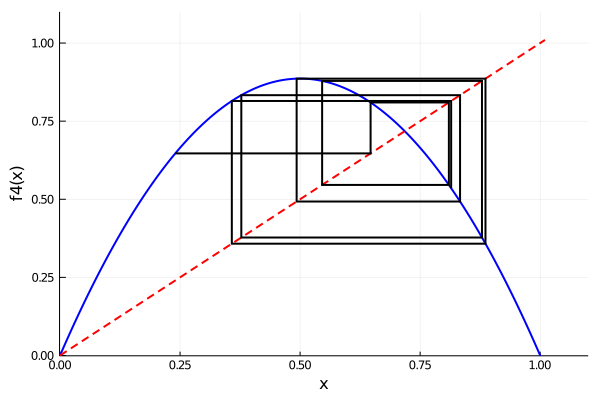

In [33]:
cobwebplot_naive(f, r, root, 10)

# Q5: Hidden curves in the bifurcation diagram of the logistic map

* Turns out they are iterates of the critical point x = 0.5

In [34]:
function g(r, cp, n)
    Nr = size(r)[1]
    cp_iterates = zeros(Nr, n+1)
    for i = 1:Nr
       cp_iterates[i, :] = fIter(f, r[i], cp, n)
    end
    return cp_iterates
end

g (generic function with 1 method)

In [35]:
cp = [r1, r2, r3, r4]

4-element Array{Float64,1}:
 1.0              
 3.0              
 3.449489742783178
 3.544094605945661

In [36]:
f2(r, x) = f(r, f(r, x))
f3(r, x) = f(r, f2(r, x))

f3 (generic function with 1 method)

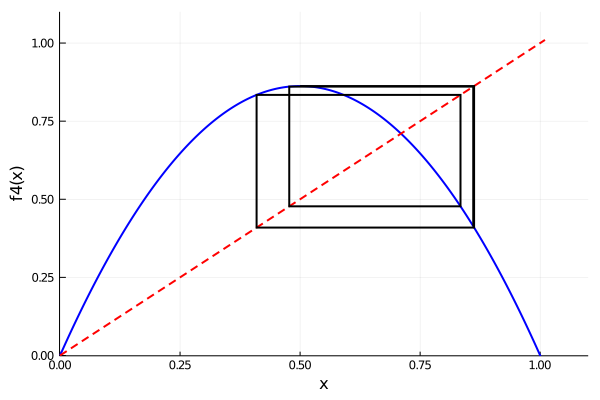

In [55]:
cobwebplot_naive(f, r3, 0.5, 5)

In [38]:
function plot_orbit_envelopes_2(r_vec)
    plot_orbit_diagram(r_vec)
    
    nr = size(r_vec)[1]
    x0 = zeros(nr)
    idx1 = findnearest(r_vec, 1)
    idx2 = findnearest(r_vec, 3)
    idx3 = findnearest(r_vec, 1+sqrt(6))
    idx4 = findnearest(r_vec, r4)
    x1 = ones(nr) - 1 ./r_vec
    
    r_2_orbit = r_vec[idx2+1:end]
    nr2 = size(r_2_orbit)[1]
    xp = ( r_2_orbit + ones(nr2) .+ sqrt.((r_2_orbit-3*ones(nr2)) .* (r_2_orbit+ones(nr2)) ) ) ./(2 .*r_2_orbit)
    xq = ( r_2_orbit + ones(nr2) .- sqrt.((r_2_orbit-3*ones(nr2)) .* (r_2_orbit+ones(nr2)) ) ) ./(2 .*r_2_orbit)
    
    r_4_orbit = r_vec[idx3+1:end]
    nr4 = size(r_4_orbit)[1]
    
    plot!(r_vec[1:idx1], x0[1:idx1], color="red", linewidth=2.0, linestyle=:solid, label="x0*")
    plot!(r_vec[idx1:end], x0[idx1:end], color="red", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(r_vec[idx1:idx2], x1[idx1:idx2], color="blue", linewidth=2.0, linestyle=:solid, label="x1*")
    plot!(r_vec[idx2:end], x1[idx2:end], color="blue", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(r_2_orbit[1:idx3-idx2], xp[1:idx3-idx2], color="green", linewidth=2.0, linestyle=:solid, label="2-orbit xp, xq")
    plot!(r_2_orbit[idx3-idx2:end], xp[idx3-idx2:end], color="green", linewidth=2.0, linestyle=:dash, label="")
    plot!(r_2_orbit[1:idx3-idx2], xq[1:idx3-idx2], color="green", linewidth=2.0, linestyle=:solid, label="")
    plot!(r_2_orbit[idx3-idx2:end], xq[idx3-idx2:end], color="green", linewidth=2.0, linestyle=:dash, label="")
    
    n0 = 80
    plot!(r_2_orbit[n0:end], f.(r_2_orbit[n0:end], 0.5), color="orange", linewidth=1.0, linestyle=:solid, label="")
    plot!(r_2_orbit[n0:end], f2.(r_2_orbit[n0:end], 0.5), color="black", linewidth=1.0, linestyle=:solid,label = "")
    plot!(r_2_orbit[n0:end], f3.(r_2_orbit[n0:end], 0.5), color="yellow", linewidth=1.0, linestyle=:solid,label = "")
    plot!(r_2_orbit[n0:end], f4.(r_2_orbit[n0:end], 0.5), color="magenta", linewidth=1.0, linestyle=:solid,label = "")

    plot!(legend=:topleft)
end

plot_orbit_envelopes_2 (generic function with 1 method)

In [39]:
Nr = 1000
r_vec = LinRange(0, 4, Nr);

plot_orbit_envelopes_2(r_vec)